# HW4: Panoramas

In this exercise we will build the following:
* An image blending mechanism based on distance transforms
* A panorama stitching algorihm using geometric image transforms (wraping)
* Cylindrical and Spherical coordinate warping
* Panorama from the spherical warped images

In [1]:
import cv2
import numpy as np
import requests
from itertools import product
import matplotlib.pyplot as plt
import matplotlib
import skimage.io as io

%matplotlib inline

## Panoramas

In this section we will build a panorama maker from scratch.

In [2]:
# Loading images for the panorama
img_urls = 'https://drive.google.com/uc?export=download&id=1DjiJ60PPxYkM9uzy7OFqxhwyDSqxyv06, \
https://drive.google.com/uc?export=download&id=1oiVYZX5F55-ZHfCeUqu5UTwFvh2viXK8, \
https://drive.google.com/uc?export=download&id=1gmxmxZ4E6Sq4OrhKgMDYhKaOwvtvcIB6, \
https://drive.google.com/uc?export=download&id=1c6eN7YOcf0GzK3zeV0U_f9ih_7_WhtTO\
'.split(', ')
# read all images with skimage.io
imgs = [cv2.resize(io.imread(url), (0,0), fx=0.25, fy=0.25) for url in img_urls]

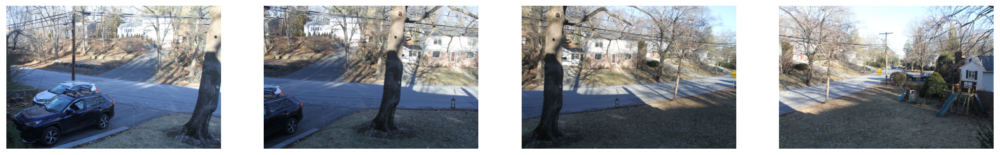

In [3]:
# show all images in a row
fig, ax = plt.subplots(1, len(imgs), figsize=(20, 10))
for i, img in enumerate(imgs):
    ax[i].imshow(img)
    ax[i].axis('off')

First, let's use the OpenCV image stitcher to create a panorama for us as a reference:

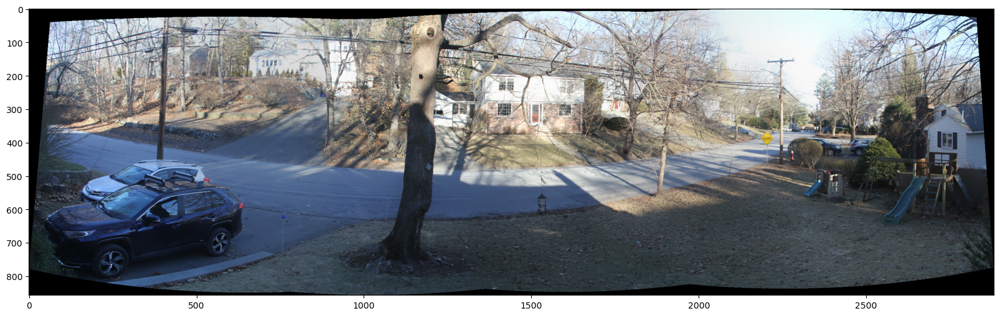

In [4]:
stitcher = cv2.Stitcher_create()
i, pano = stitcher.stitch(imgs)
plt.figure(figsize=(20, 10))
plt.imshow(pano)

That's cool. Although notice that it didn't use the 4th image... 🤔

Anyway - it's time to get started!

As you may remember our way of building panoramas is a simple algorithm
* extract keypoints and descriptors from all images
* find matches between all images
* select a reference image
* begin adding the other images together with the reference image by
  * find a transformation between them
  * blend the images together
* optionally: run bundle adjustment to fine the best parameters (we will not do this in this HW assignment)

In [5]:
# to extract keypoints and descriptors we need a feature detector and a matcher
# we use SIFT detector (`cv2.SIFT_create()`) and L2 norm matcher (`cv2.BFMatcher_create(cv2.NORM_L2, True)`)
detector = cv2.SIFT_create()
matcher = cv2.BFMatcher_create(cv2.NORM_L2, True)

We will build a few functions that we can reuse later on for multiple scenarios

In [49]:
# this function returns the matched points between two images
# it also returns the matches (cv2.DMatch) themselves
# we don't need fancy matching filtering here, so we just return all matches
# downstream we will filter them based on the homography inliers from RANSAC
def getMatchedPointsBetween(i,j,kpts_,desc_,matcher_):
    # get matched points between images i and j (e.g. desc_[i], desc_[j])
    matches = matcher_.match(desc_[i], desc_[j])
    # get the matched points (e.g. kpts_[i], kpts_[j])
    # note that `for m in matches`, m.queryIdx is the index of the matched point in the first (left, "i") image
    # and m.trainIdx is the index of the matched point in the second (right, "j") image
    mptsi = [kpts_[i][m.queryIdx].pt for m in matches]
    mptsj = [kpts_[j][m.trainIdx].pt for m in matches]
 
    # return the matched points (np.array(mptsi), np.array(mptsj)) and the `matches` themselves
    return np.array(mptsi), np.array(mptsj), matches
    
# this function returns the matched points, transforms and inliers between all images
def getTransformsAndInliers(kpts_,desc_,matcher_,geometric_model_function=cv2.findHomography):
    # calculate homographies between all image pairs, and store them in a list along with the inliers and matches
    # 0 -> 1,2,3
    # 1 -> 2,3
    # 2 -> 3
    transforms_and_inliers = [[(),(),(),()], [(),(),(),()], [(),(),(),()]]
    for i in range(3):
        for j in range(i+1,4):
            # get matched points between images i and j using `getMatchedPointsBetween`, kpts_, desc_, and matcher_
            mptsL,mptsR,matches = getMatchedPointsBetween(i,j,kpts_,desc_,matcher_)
            # calculate the homography between the matched points using `geometric_model_function`
            # note that `geometric_model_function` is a function that takes two sets of points and returns a transformation
            # for example, `geometric_model_function` can be `cv2.findHomography` or `cv2.estimateAffine2D`
            # `geometric_model_function` returns a tuple of (M, mask)
            # M is the transformation matrix, and mask is a boolean array of inliers
            # note that `geometric_model_function` can also take a `method` argument, which is the RANSAC method
            # for example, `geometric_model_function` can be `cv2.findHomography(mptsL,mptsR,method=cv2.RANSAC)`
            # you may need to use np.array(mptsL) and np.array(mptsR) to convert the points to numpy arrays
            M, inliers_homogr = geometric_model_function(np.array(mptsL), np.array(mptsR), method=cv2.RANSAC)
         
            # store the transformation, inliers, and matches as a 3-tuple in the 2D list `transforms_and_inliers` (see above)
            # note that `transforms_and_inliers[i][j]` is the transformation from image i to image j
            transforms_and_inliers[i][j] = (M, inliers_homogr, matches)
    return transforms_and_inliers

# this function returns the matched points, transforms and inliers between all images
# it also returns the keypoints and descriptors themselves which will be useful later for visualization
def getTransformsAndInliersForImages(images_, geometric_model_function=cv2.findHomography, masks=None):
    if masks is None:
        masks = [None] * len(images_)
    # get keypoints and descriptors for all images (e.g. `for img, mask in zip(images_, masks_)`)
    # use `cv2.equalizeHist` to equalize the histogram of the grayscale image (e.g. `cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))`
    # use `detector.detectAndCompute` to get the keypoints and descriptors
    # note that `detector.detectAndCompute` returns a tuple of (keypoints, descriptors)
    # and, `detector.detectAndCompute` takes a mask argument, which is a binary image with the same size as the input image
    # the mask is used to indicate which pixels are valid keypoints
    # the mask is a binary image with some pixels set to zero, then `detector.detectAndCompute` will only detect keypoints in the pixels with value 1
    # for example, if we want to detect keypoints only in the center of the image, we can create a mask with all pixels set to zero, then set the center pixels to 1
    # then, `detector.detectAndCompute` will only detect keypoints in the masked portion of the image
    # note that `detector.detectAndCompute` will return a tuple of (keypoints, descriptors) 
    # you may want to use `zip(*[...])` to unzip the list of tuples into two lists - kpts_ and desc_

    # kpts_, desc_ = zip(*[detector.detectAndCompute(cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)), mask) for img, mask in zip(images_, masks)])

    kpts_ = []
    desc_ = []
    # Iterate over each image and its corresponding mask
    for img, mask in zip(images_, masks):
        eq_img = cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
        keypoints, descriptors = detector.detectAndCompute(eq_img, mask)

        # Append the keypoints and descriptors to their respective lists
        kpts_.append(keypoints)
        desc_.append(descriptors)

    # get the transforms and inliers between all images using `getTransformsAndInliers`
    # return the (transforms + inliers tuple), keypoints (kpts_), and descriptors (desc_)
    return (getTransformsAndInliers(kpts_, desc_, matcher, geometric_model_function), kpts_, desc_)

In [50]:
# get the transforms and inliers between all images using `getTransformsAndInliersForImages` and `cv2.findHomography`
# as the "geometric model function" (see above)
transforms_and_inliers, kpts, desc = getTransformsAndInliersForImages(imgs, cv2.findHomography)

/var/folders/nx/k4rd7b296w3d78fps9fccz580000gn/T/ipykernel_32109/798577326.py:27: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


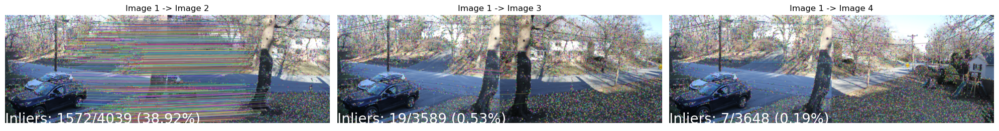

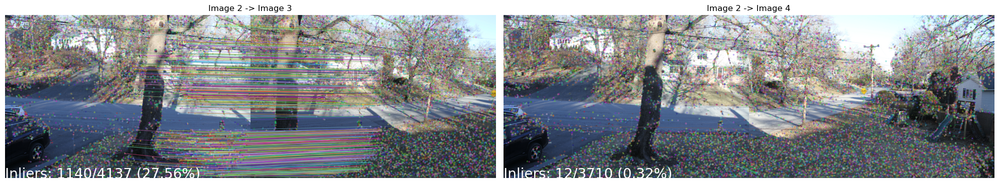

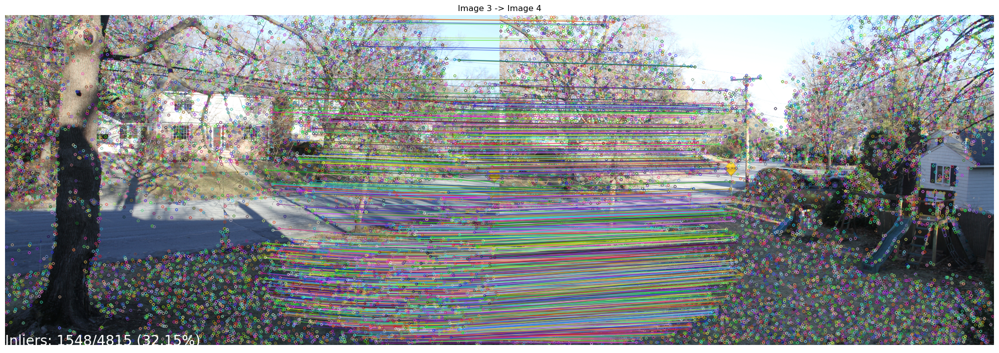

In [55]:
# show the matching between all image pairs. don't show plots without matches
for i in range(3):
    fig, axs = plt.subplots(1, 3-i, figsize=(20, 20))
    for j in range(i+1,4):
        if i < 2:
            ax = axs[j-i-1]
        else:
            ax = axs
        # get the inlier matches using `transforms_and_inliers[i][j][1]` (inliers mask) and `transforms_and_inliers[i][j][2]` (matches)
        # note that `transforms_and_inliers[i][j][1]` needs to be squeezed to remove the extra dimension 
        # (e.g. `transforms_and_inliers[i][j][1].squeeze()`), otherwise the boolean indexing will not work
        # note that `transforms_and_inliers[i][j][2]` is a [] list of `cv2.DMatch` objects, so we should wrap it in `np.array` 
        # (e.g. `np.array(transforms_and_inliers[i][j][2])`) so that we can use boolean indexing
      
        inlier_matches = np.array(transforms_and_inliers[i][j][2])[transforms_and_inliers[i][j][1].astype(bool).squeeze()]
        
        # draw the matches between images i and j using `cv2.drawMatches`, imgs[i], kpts[i], imgs[j], kpts[j], and inlier_matches
        ax.imshow(cv2.drawMatches(imgs[i], kpts[i], imgs[j], kpts[j], inlier_matches, None))
        # write the number of inliers, the percentage and the number of matches, on the bottom left corner of the image
        total_inliers = len(transforms_and_inliers[i][j][2])
        ax.text(0, imgs[i].shape[0], 'Inliers: {}/{} ({:.2f}%)'.format(len(inlier_matches), total_inliers, len(inlier_matches)/total_inliers*100), color='white', fontsize=20)
        ax.set_title('Image {} -> Image {}'.format(i+1,j+1))
        ax.axis('off')
    fig.tight_layout()
    fig.show()

In [58]:
# print the number of inliers for each image pair with percentage (up to 2 decimal places)
for i in range(3):
    for j in range(i+1,4):
        # get the inlier matches using `transforms_and_inliers[i][j][1]` (inliers mask) and `transforms_and_inliers[i][j][2]` (matches)
        # note that `transforms_and_inliers[i][j][1]` needs to be squeezed to remove the extra dimension
        # (e.g. `transforms_and_inliers[i][j][1].squeeze()`), otherwise the boolean indexing will not work
        # note that `transforms_and_inliers[i][j][2]` is a [] list of `cv2.DMatch` objects, so we should wrap it in `np.array`
        # (e.g. `np.array(transforms_and_inliers[i][j][2])`) so that we can use boolean indexing
        inlier_matches = np.array(transforms_and_inliers[i][j][2])[transforms_and_inliers[i][j][1].astype(bool).squeeze()]
        # print the number of inliers, the percentage and the number of matches
        print('Image {} -> Image {}: {} ({:.2f}%)'.format(i+1,j+1,len(inlier_matches),len(inlier_matches)/len(transforms_and_inliers[i][j][2])*100))

Image 1 -> Image 2: 1572 (38.92%)
Image 1 -> Image 3: 19 (0.53%)
Image 1 -> Image 4: 7 (0.19%)
Image 2 -> Image 3: 1140 (27.56%)
Image 2 -> Image 4: 12 (0.32%)
Image 3 -> Image 4: 1548 (32.15%)


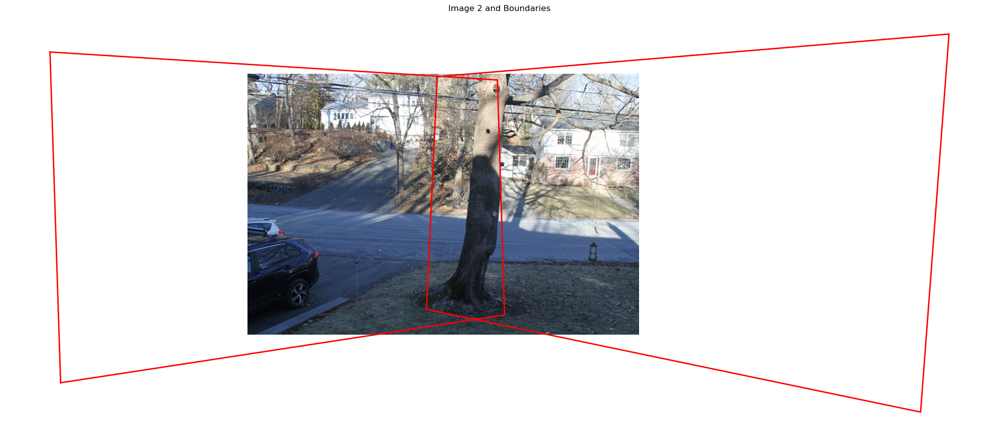

In [59]:
# show the 2nd image and the other images boundaries as polygons on top of it, after applying the homography
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(imgs[1])
for i in [0, 2]:
    # get the 4 corners of the image
    w, h = imgs[i].shape[1], imgs[i].shape[0]
    corners = np.array([[0,0],[w,0],[w,h],[0,h]]).astype(np.float32)
    # if i == 2 invert the homography to get the homography from the other image to the 2nd image
    if i == 2:
        H = np.linalg.inv(transforms_and_inliers[1][i][0])
    else:
        H = transforms_and_inliers[i][1][0]

    # apply the homography to the corners and reshape the result to be a 4x2 array of points
    # note that `cv2.perspectiveTransform` expects a 3D array of points, so we need to reshape the corners to be a Nx1x2 array
    # and then reshape the result to be a 4x2 array of points (e.g. `corners.reshape(-1,1,2)` and `corners.reshape(4,2)` respectively)
    corners = cv2.perspectiveTransform(corners.reshape(-1,1,2), H).reshape(4,2)
    # draw the polygon, add the first point at the end to close the polygon
    ax.plot(corners[:,0], corners[:,1], 'r-', lw=2)
    ax.plot([corners[0,0], corners[3,0]], [corners[0,1], corners[3,1]], 'r-', lw=2)
ax.axis('off')
ax.set_title('Image 2 and Boundaries')
fig.tight_layout()

In [90]:
# this function is used to create a mask for the center of the image (to be used in the blending)
# the mask is a distance transform of a circle in the center of the image
def create_distance_transform_mask(im):
    # use a distance transform for the mask
    # first create a mask image with the same size as the image, type np.uint8 and fill it with 1s
    mask = np.ones(im.shape[:2], dtype=np.uint8)
    # paint a black circle in the center of the image with cv2.circle
    # the circle should have a radius of 3 and a thickness of -1 (filled)
    # the circle should be in the center of the image, e.g. (im.shape[1]//2, im.shape[0]//2)
    cv2.circle(mask, (im.shape[1]//2, im.shape[0]//2), 3, 0, -1)
    # use cv2.distanceTransform to get the distance transform of the mask
    # use cv2.DIST_C for the distance type and 5 for the mask size
    mask = cv2.distanceTransform(mask, cv2.DIST_C, 5)
    # normalize the mask to be between 0 and 1 using cv2.normalize and cv2.NORM_MINMAX and subtract it from 1 (inverse)
    mask = 1 - cv2.normalize(mask, None, 0, 1, cv2.NORM_MINMAX)
    return mask

# this function is used to blend the images together
# lets allow the user to choose between 2 different blending methods:
# 1. use an avergae value per-pixel to blend the images together
# 2. use the distance-transform mask to blend the images together
def stitch_images(imgs_Ts_and_masks, blend_method=0):
    num_imgs = len(imgs_Ts_and_masks)

    # get the center image and its (potential) mask
    img_center = imgs_Ts_and_masks[0][0]
    img_center_mask = imgs_Ts_and_masks[0][2]

    # create a "big" image to show all the images on top of each other
    # the big image should have the same height as the center image
    # the big image should have the width of the center image multiplied by the number of images
    # the big image should have 3 channels (RGB, np.uint8), filled with 0s
    # the big image should be a 4D array (e.g. `np.zeros((num_imgs, img_center.shape[0], img_center.shape[1]*3, 3), dtype=np.uint8)`)
    # we will use a 4th dimension (the 0/first dimension) to store all the images, so that we can blend them later
    big_img = np.zeros((num_imgs, img_center.shape[0], img_center.shape[1]*num_imgs, 3), dtype=np.uint8)
    # create a big mask to use for the blending
    # the big mask should have the same height as the center image
    # the big mask should have the width of the center image multiplied by the number of images
    # the big mask should have 1 channel (np.float32), filled with 0s
    # the big mask should be a 3D array (e.g. `np.zeros(big_img.shape[:-1], dtype=np.float32)`)
    big_mask = np.zeros(big_img.shape[:-1], dtype=np.float32)

    # add the center image to the big image (in the img_center.shape[1]:img_center.shape[1]*2 x-axis range, in the 0/first place)
    big_img[0, :, img_center.shape[1]:img_center.shape[1]*2] = img_center
    
    # add the center image mask to the big mask
    # create a mask for the center image
    if blend_method == 0:
        # use a simple mask with 1s, in the img_center.shape[1]:img_center.shape[1]*2 x-axis range
        # big_mask[...] = 1
        big_mask[img_center.shape[1]:img_center.shape[1]*2] = 1 
    if blend_method == 1:
        # use a distance transform mask, using the function `create_distance_transform_mask` defined above
        # and place it in the img_center.shape[1]:img_center.shape[1]*2 x-axis range
        mask = create_distance_transform_mask(img_center)
        big_mask[0, :,img_center.shape[1]:img_center.shape[1]*2] = mask
    
    # if the center image has a mask, multiply the mask with the big mask
    if img_center_mask is not None:
        # multiply the mask with the big mask in the img_center.shape[1]:img_center.shape[1]*2 x-axis range
        # (use the *= operator) if the center image has a mask
        big_mask[img_center.shape[1]:img_center.shape[1]*2] *= img_center_mask

    # add the other images to the big image
    # for each image-and-transform tuple (im, H, im_mask) in imgs_Ts_and_masks[1:] (skip the first one, which is the center image)
    #   apply the homography H to the image im
    #   add the image to the big image in the img_center.shape[1]*l:img_center.shape[1]*(l+1) x-axis range
    #   (use the l variable to keep track of the current image index)
    #   apply the homography H to the image mask im_mask
    #   add the image mask to the big mask in the img_center.shape[1]*l:img_center.shape[1]*(l+1) x-axis range
    #   if the image has a mask, multiply the mask with the big mask

    for l, (im, H, im_mask) in enumerate(imgs_Ts_and_masks[1:]):
        # we need to shift the homography to the right by img_center.shape[1]*l
        # use the np.matmul function to multiply the homography with a simple translation matrix
        # use the np.array function to create the translation matrix
        # the translation matrix should be of shape (3,3) with 1s on the diagonal
        # and -img_center.shape[1]*l in the last row, first column (for a translation in the x-axis)
        H = np.matmul(np.array([[1,0,img_center.shape[1]*l],[0,1,0],[0,0,1]]), H)

        # create a mask for the image, same size as the image, similar to the code above
        # use the blend_method variable (0 or 1) to determine which mask to use: 0 = simple mask, 1 = distance transform mask
        if blend_method == 0:
            # use a simple mask with 1s (np.ones) of the same size as the image (im.shape), dtype=np.float32
            mask = np.ones(im.shape[:2], dtype=np.float32)
        elif blend_method == 1:
            # use a distance transform mask, using the function `create_distance_transform_mask` defined above
            mask = create_distance_transform_mask(im)

        # add the mask to the big mask, same as above
        if im_mask is not None:
            mask *= im_mask

        # apply the homography to the mask by using the cv2.warpPerspective function
        # the shape of the output should be (big_mask.shape[1], big_mask.shape[2])
        # the output should be the big_mask[l+1] (the l+1-th image in "big mask")
        # remember to use the borderMode=cv2.BORDER_TRANSPARENT parameter to avoid black borders
        big_mask[l+1] = cv2.warpPerspective(mask, H, (big_mask.shape[2], big_mask.shape[1]), borderMode=cv2.BORDER_TRANSPARENT)

        # apply the homography to the image by using the cv2.warpPerspective function
        # the shape of the output should be (big_img.shape[1], big_img.shape[2])
        big_img[l+1] = cv2.warpPerspective(im, H, (big_img.shape[2], big_img.shape[1]), borderMode=cv2.BORDER_TRANSPARENT)
    
    # save the original big mask (before normalization) for visualization later
    big_mask_orig = big_mask.copy()

    # normalize the mask (divide by the sum of the mask)
    big_mask_sum = np.sum(big_mask, axis=0)
    for i in range(num_imgs):
        # divide the big_mask[i] by the sum of the mask (big_mask_sum), but only for the pixels that are > 0 (use the big_mask[i] > 0 condition)
        big_mask[i][big_mask[i] > 0] /= big_mask_sum[big_mask[i] > 0]

    # blend the images using the mask
    big_img_out = np.zeros(big_img.shape[1:], dtype=np.float32)
    for i in range(num_imgs):
        # multiply the image (big_img[i]) with the mask (big_mask[i]) and add it to the big_img_out
        # use the np.repeat function to repeat the mask 3 times (for the 3 color channels, RGB)
        # the trick is to use big_mask[i][...,None] and axis=2 for np.repeat to get the right shape
        # use the np.float32 type for the big_mask[i] and the big_img[i]
        big_img_out += (big_img[i]).astype(np.float32) * np.repeat(big_mask[i][...,None].astype(np.float32), 3, axis=2)

    # convert the big_img_out to uint8 (with `.astype(np.uint8)`)
    return big_img_out.astype(np.uint8), big_mask, big_mask_orig


# run the function with the images and the transforms and inliers from the previous cell
# lets use imgs[1] as the center image, and imgs[0] as the left image, imgs[2] as the right image, and imgs[3] as the last image
# imgs[1] is the center image, so we don't need to apply any transform to it, so we use the identity matrix (np.eye(3))
# imgs[0] is the left image, so we need to apply the transform transforms_and_inliers[0][1][0] (0->1) to it
# imgs[2] is the right image, so we need to apply the inverse of the transform transforms_and_inliers[1][2][0] to it (np.linalg.inv, to get 2->1 transform)
# imgs[3] is the last image, so we need to apply the inverse of the transform transforms_and_inliers[1][2][0] (2->1) and transforms_and_inliers[2][3][0] (3->2) to it
#   we can use the np.matmul function to multiply the two transforms and then use np.linalg.inv to get the overall inverse (3->2->1 = 3->1)
big_img, big_mask, big_mask_orig = stitch_images([
        (imgs[1], np.eye(3), None),
        (imgs[0], transforms_and_inliers[0][1][0], None),
        (imgs[2], np.linalg.inv(transforms_and_inliers[1][2][0]), None),
        (imgs[3], np.linalg.inv(np.matmul(transforms_and_inliers[1][2][0], transforms_and_inliers[2][3][0])), None)
    ],
    blend_method=1
    )

/var/folders/nx/k4rd7b296w3d78fps9fccz580000gn/T/ipykernel_32109/486619240.py:120: RuntimeWarning: overflow encountered in multiply
  big_img_out += (big_img[i]).astype(np.float32) * np.repeat(big_mask[i][...,None].astype(np.float32), 3, axis=2)
/var/folders/nx/k4rd7b296w3d78fps9fccz580000gn/T/ipykernel_32109/486619240.py:120: RuntimeWarning: invalid value encountered in multiply
  big_img_out += (big_img[i]).astype(np.float32) * np.repeat(big_mask[i][...,None].astype(np.float32), 3, axis=2)
/var/folders/nx/k4rd7b296w3d78fps9fccz580000gn/T/ipykernel_32109/486619240.py:120: RuntimeWarning: overflow encountered in add
  big_img_out += (big_img[i]).astype(np.float32) * np.repeat(big_mask[i][...,None].astype(np.float32), 3, axis=2)
/var/folders/nx/k4rd7b296w3d78fps9fccz580000gn/T/ipykernel_32109/486619240.py:123: RuntimeWarning: invalid value encountered in cast
  return big_img_out.astype(np.uint8), big_mask, big_mask_orig


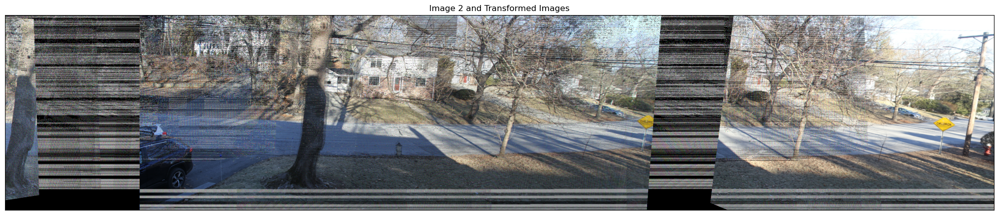

In [91]:
# show the 2nd image, use homograpy to transform image 1 and image 3 to the 2nd image and show them on top of it
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(big_img)
ax.set_title('Image 2 and Transformed Images')
ax.set_xlim(700, big_img.shape[1]-100)
# remove all the ticks
ax.set_xticks([])
ax.set_yticks([])
fig.tight_layout()

That's looking pretty good!

But we talked about the potential problems of a projective panorama.

If you're brave you can try the same process above, but with an affine transformation with the `getTransformsAndInliersForImages` function...

### Cylindrical coordinates and warping

Remember the formulas we saw in class for cylindrical coordinate image warping:

$$
\begin{align}
\hat{x} &= \sin \theta \\
\hat{y} &= h \\
\hat{z} &= \cos \theta
\end{align}
$$

In [ ]:
def cylindrical_warp(img, K):
    """This function returns the cylindrical warp for a given image and intrinsics matrix K"""
    # get image shape (h,w)
    h_,w_ = img.shape[:2]
    # pixel coordinates. x_i is a matrix of shape (h,w) where each element is its x coordinate
    # y_i is a matrix of shape (h,w) where each element is its y coordinate
    # use np.indices() to get the x_i and y_i matrices
    y_i, x_i = ...
    # add a 1 to each pixel coordinate (to make it homogeneous) by using np.stack and np.ones_like(x_i)
    # then reshape the result to (h*w, 3) (use .reshape(h_*w_,3)) to get a list of 3d points
    X = ...
    # normalize the coordinates by using the inverse of the intrinsics matrix K
    # use np.linalg.inv to get the inverse of K
    Kinv = ...
    # use np.dot to multiply the inverse of K by X.T and then transpose the result to get the normalized coordinates
    X = ...
    # calculate cylindrical coords (sin\theta, h, cos\theta)
    # use np.stack to stack the sin\theta, h, cos\theta matrices (use np.sin, np.cos)
    # then reshape the result to (h*w, 3) (use .reshape(h_*w_,3)) to get a list of 3d points
    # X[:,0] is our \theta, X[:,1] is the h
    A = ...
    # project back to image-pixels plane using the intrinsics matrix K (use .dot again)
    # make sure to transpose the result (use .T) to get the result in the right shape
    B = ...
    # back from homog coords (divide B[:,:-1] by last coord, e.g. B[:,[-1]])
    B = ...
    # make sure warp coords only within image bounds
    # use a logical or (use | for or) to get the pixels that are out of bounds 
    # e.g. if B[:,0] < 0 or B[:,0] >= w_ or B[:,1] < 0 or B[:,1] >= h_
    # then set them to -1 (use B[<condition above>] = -1)
    B[...] = -1
    # reshape B to image shape again (use .reshape(h_,w_,-1))
    B = ...
    # create a mask for the pixels that are out of bounds
    # use B[:,:,0] != -1 to get the pixels that are not out of bounds
    # then use .astype(np.uint8) to convert the result to uint8 (0 or 255) and * 255 to get 0 or 255
    mask = ...
    
    img_rgba = cv2.cvtColor(img,cv2.COLOR_BGR2BGRA) # for transparent borders...
    # warp the image according to cylindrical coords
    # use cv2.remap to warp the img_rgba according to the B "mapping" (B[:,:,0] is the x coords, B[:,:,1] is the y coords)
    # cast B to float32 (use .astype(np.float32))
    # use cv2.INTER_AREA for interpolation
    # use borderMode=cv2.BORDER_CONSTANT and borderValue=(0,0,0,0) (transparent) for border handling
    warped = ...
    # return the warped image and the mask
    return warped, mask

In [ ]:
w,h_2 = imgs[0].shape[1], imgs[0].shape[0]/2
# create a "mock" intrinsics matrix K, with focal length 1200 and principal point in the center of the image (w/2,h/2)
# use np.array to create the matrix. the matrix should be of shape (3,3), with the focal length in the diagonal
# and the principal point in the last column
K = ...

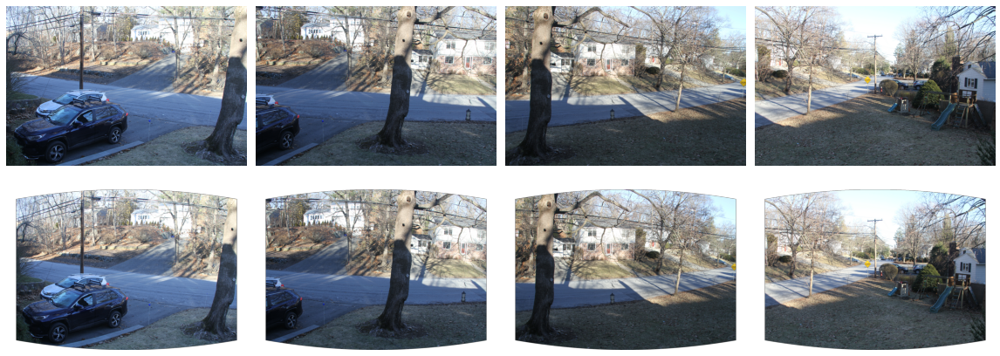

In [ ]:
plt.figure(figsize=(20,6))
for i,img in enumerate(imgs):
    plt.subplot(2,5,i+1),plt.imshow(img),plt.axis('off') # needed to remove alpha noise from cv2.imsave??
    plt.subplot(2,5,5+i+1),plt.imshow(cylindrical_warp(img,K)[0]),plt.axis('off')
plt.tight_layout()

### Spherical coordinates and warping

Remember the formulas for spherical warping we saw in class:
$$
\begin{align}
\hat{x} &= \sin \theta \cos \phi \\
\hat{y} &= \sin \phi \\
\hat{z} &= \cos \theta \cos \phi
\end{align}
$$

In [ ]:
def sphericalWarp(img, K):
    """This function returns the spherical warp for a given image and intrinsics matrix K"""
    h_,w_ = img.shape[:2]
    # get pixel coordinates (x_i is a matrix of shape (h,w) where each element is its x coordinate
    # y_i is a matrix of shape (h,w) where each element is its y coordinate)
    # use np.indices to get the x_i and y_i matrices, same as in the cylindrical warp
    y_i, x_i = ...
    # homogeneous coordinates - add a 1 to each pixel coordinate (to make it homogeneous)
    # use np.stack and np.ones_like(x_i), then reshape the result to (h*w, 3) (use .reshape(h_*w_,3))
    X = ...

    # inverse intrinsics - normalize the coordinates by using the inverse of the intrinsics matrix K
    # use np.linalg.inv to get the inverse of K
    Kinv = ...
    # normalized coords - use np.dot to multiply the inverse of K by X.T and then transpose the result
    X = ...

    # calculate cylindrical coords (sin\theta * cos\phi, sin\phi, cos\theta * cos\phi)
    # use np.stack (axis -1) to create the matrix A
    # use np.sin and np.cos to calculate the sin and cos of the angles
    # use .reshape(h_*w_,3) to reshape the result to (h*w, 3)
    # our \theta is X[:,0] and our \phi is X[:,1]
    A = np.stack([
        ...
        ],axis=-1).reshape(w_*h_,3)

    # project back to image-pixels plane, using the intrinsics matrix K (use np.dot again)
    # same as in the cylindrical warp
    B = ...
    B = ...
    # make sure warp coords only within image bounds... same as in the cylindrical warp
    B[...] = -1
    # reshape B to image shape again... same as in the cylindrical warp
    B = ...
    # create a mask for the pixels that are out of bounds... same as in the cylindrical warp
    mask = (B[:,:,0] != -1).astype(np.uint8) * 255

    img_rgba = cv2.cvtColor(img,cv2.COLOR_BGR2BGRA) # for transparent borders...
    # warp the image according to spherical coords, same as in the cylindrical warp
    warped = ...
    return warped, mask

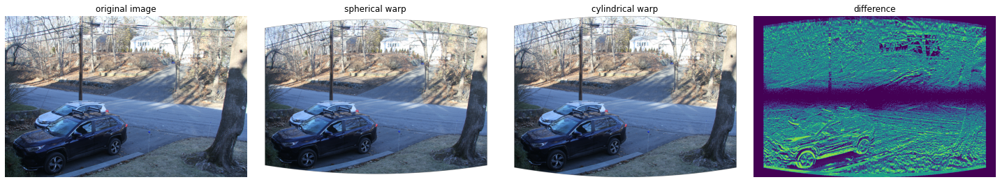

In [ ]:
# let's show a comparison between the spherical and cylindrical warp
plt.figure(figsize=(20,10))
imwarp, _ = sphericalWarp(imgs[0],K);
plt.subplot(1,4,1),plt.imshow(imgs[0]),plt.axis('off'),plt.title('original image')
plt.subplot(1,4,2),plt.imshow(imwarp),plt.axis('off'),plt.title('spherical warp')
imwarpcyl = cylindrical_warp(imgs[0],K)[0];
plt.subplot(1,4,3),plt.imshow(imwarpcyl),plt.axis('off'),plt.title('cylindrical warp')
plt.subplot(1,4,4),plt.imshow(np.linalg.norm(imwarp-imwarpcyl,axis=-1)),plt.axis('off'),plt.title('difference')
plt.tight_layout()

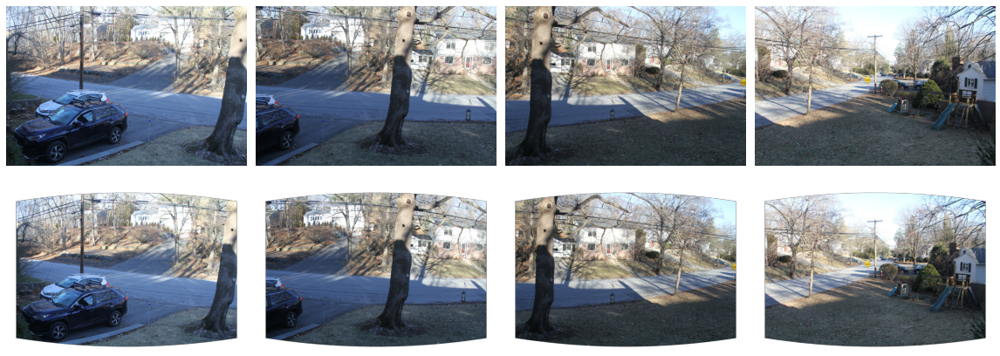

In [ ]:
# show images and their spherical warps
plt.figure(figsize=(20,6))
for i,img in enumerate(imgs):
    plt.subplot(2,5,i+1),plt.imshow(img),plt.axis('off')
    plt.subplot(2,5,5+i+1),plt.imshow(sphericalWarp(img,K)[0]),plt.axis('off')
plt.tight_layout()


Now let's create a panorama from the spherical warped images

Since this is in spherical coordinates we can look for a simple rigid transform (rotation, scale and translation) instead of full affine or a homography

In [ ]:
# get the spherical warps of all the images (`for im in imgs`) with their masks
imgs_sph_with_masks = [...]
# get the images and the masks separately out of the imgs_sph_with_masks
# use list comprehension to get the images and the masks separately, but note that you can use zip to get both at once...
imgs_sph = [...]
masks_sph = [...]
# get the transforms and inliers for the spherical warps using getTransformsAndInliersForImages
# this time use cv2.estimateAffinePartial2D as the estimator function (instead of cv2.findHomography)
# since in the spherical warp we used the "similarity" transformation (which is a subset of the affine transformation)
# and not the "full affine" transformation
# use the masks_sph as the masks argument, so that the inliers will be calculated only for the pixels that are not masked
transforms_and_inliers_A_sph, kpts_sph, desc_sph = ...

In [ ]:
# create a big image to show the spherical images on top of each other
# use the stitch_images function with the imgs_sph and the masks_sph
# use blend_method=1 to get a nice blending between the images
# use the same order as in the projective panorama (i.e. the 2nd image is in the center, and the 1st and 3rd are on the sides)
big_img_sph, big_mask_sph, big_mask_orig_sph = stitch_images([
        (cv2.cvtColor(imgs_sph[1], cv2.COLOR_RGBA2RGB), ...),
        (cv2.cvtColor(imgs_sph[0], cv2.COLOR_RGBA2RGB), ...),
        (cv2.cvtColor(imgs_sph[2], cv2.COLOR_RGBA2RGB), ...),
    ],
    blend_method=1
    )

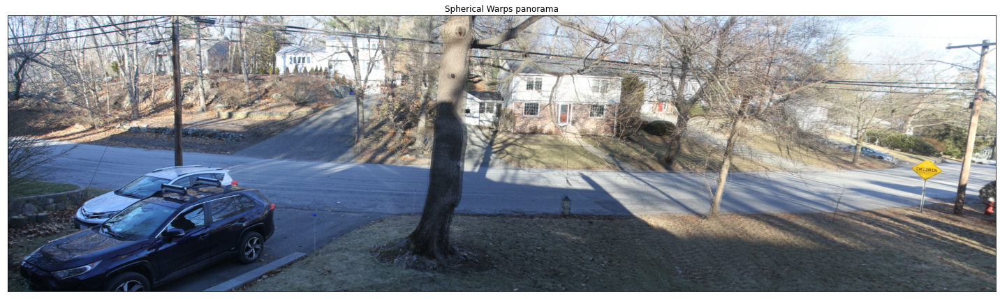

In [ ]:
# show the 2nd image, use homograpy to transform image 1 and image 3 to the 2nd image and show them on top of it
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(big_img)
ax.set_title('Spherical Warps panorama') 
ax.set_xlim(700, big_img.shape[1]-100) # cropping the image to show only the "good parts" :D
# remove all the ticks
ax.set_xticks([])
ax.set_yticks([])
fig.tight_layout()

Beautiful!

Now, there's some blurring going on which could possibly be mitigated if we run bundle adjustment to find the real camera intrinsics and other parameters that will minimize any mislignment between features.

We will come back to bundle adjustment in a later assignment.

Well done!